<a href="https://colab.research.google.com/github/sirigadde/AI_ML-Projects/blob/main/SSD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
from imutils.video import FPS
import numpy as np
import imutils
import cv2

In [5]:
from google.colab import drive
drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
from google.colab.patches import cv2_imshow

[INFO] setting preferable backend and target to CUDA...
[INFO] accessing video stream...


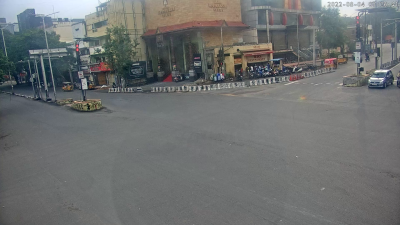

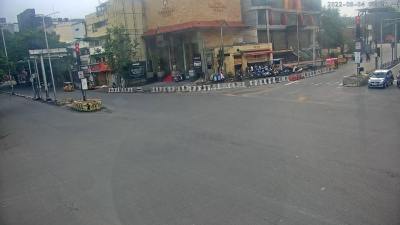

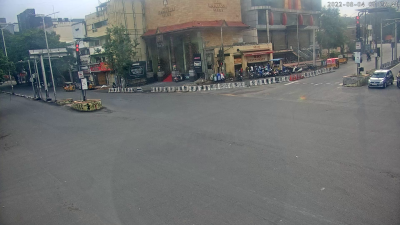

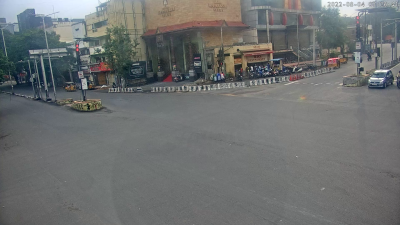

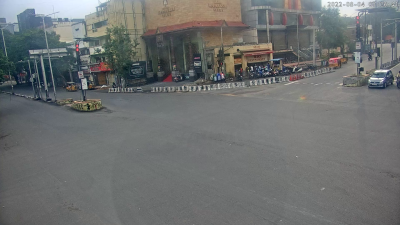

...

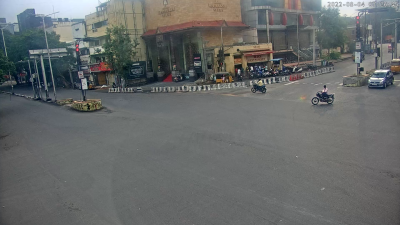

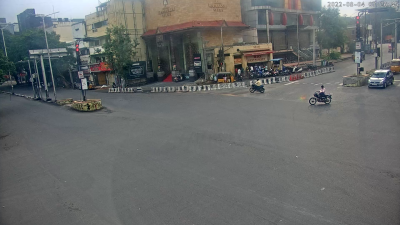

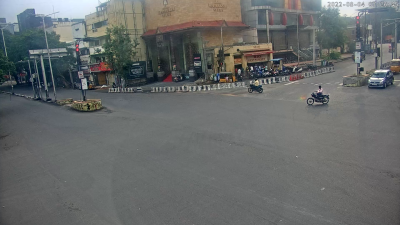

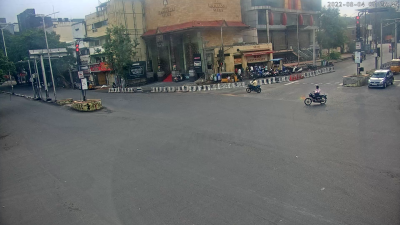

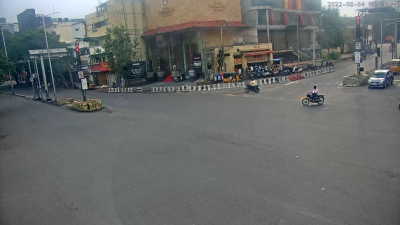

In [ ]:
use_gpu = True
live_video = False
confidence_level = 0.5
fps = FPS().start()
ret = True
CLASSES = ["background", "aeroplane", "bicycle", "bird", "boat",
           "bottle", "bus", "car", "cat", "chair", "cow", "diningtable",
           "dog", "horse", "motorbike", "person", "pottedplant", "sheep",
           "sofa", "train", "tvmonitor"]

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

net = cv2.dnn.readNetFromCaffe('/content/drive/MyDrive/ssd_files/MobileNetSSD_deploy.prototxt','/content/drive/MyDrive/ssd_files/MobileNetSSD_deploy.caffemodel')

if use_gpu:
    print("[INFO] setting preferable backend and target to CUDA...")
    net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
    net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)


print("[INFO] accessing video stream...")
if live_video:
    vs = cv2.VideoCapture(0)
else:
    vs = cv2.VideoCapture('/content/drive/MyDrive/ssd_files/trafficvideo.mp4')

# Initialize VideoWriter
fourcc = cv2.VideoWriter_fourcc(*'XVID')
output_video = cv2.VideoWriter('output_video.avi', fourcc, 30, (400, 300))

while ret:
    ret, frame = vs.read()
    if ret:
        frame = imutils.resize(frame, width=400)
        (h, w) = frame.shape[:2]
        blob = cv2.dnn.blobFromImage(frame, 0.007843, (300, 300), 127.5)
        net.setInput(blob)
        detections = net.forward()

        for i in np.arange(0, detections.shape[2]):
            confidence = detections[0, 0, i, 2]
            if confidence > confidence_level:
                idx = int(detections[0, 0, i, 1])
                box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                (startX, startY, endX, endY) = box.astype("int")

                label = "{}: {:.2f}%".format(CLASSES[idx], confidence * 100)
                cv2.rectangle(frame, (startX, startY), (endX, endY), COLORS[idx], 2)

                y = startY - 15 if startY - 15 > 15 else startY + 15
                cv2.putText(frame, label, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, COLORS[idx], 2)

        cv2_imshow(frame)
        output_video.write(frame)

        if cv2.waitKey(1) == 27:
            break

        fps.update()

# Release VideoWriter and close video window
output_video.release()
cv2.destroyAllWindows()

fps.stop()

print("[INFO] elapsed time: {:.2f}".format(fps.elapsed()))
print("[INFO] approx. FPS: {:.2f}".format(fps.fps()))

